In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage

(<matplotlib.axes._subplots.AxesSubplot at 0x122610a58>,
 (-0.5, 511.5, 511.5, -0.5))

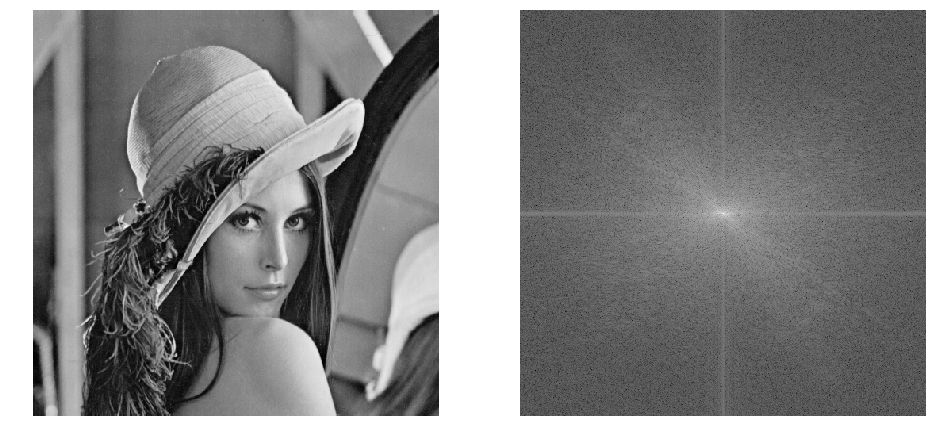

In [2]:
img = plt.imread('images/lena.bmp')
# img = 0.2126 * img[:,:,0] + 0.7152 * img[:,:,1] + 0.0722 * img[:,:,2]

plt.figure(figsize=(16,16))
plt.subplot(121), plt.imshow(img, 'gray'), plt.axis('off')

fft_shift = np.fft.fftshift(np.fft.fft2(img))
fft_img = np.log(np.abs(fft_shift))
plt.subplot(122), plt.imshow(fft_img, 'gray'), plt.axis('off')

In [3]:
def distance(shape):
    n, m = shape
    u = np.arange(n)
    v = np.arange(m)
    u, v = np.meshgrid(u, v)
    return np.sqrt((u - n//2)**2 + (v - m//2)**2)

In [4]:
def ideal_filter(shape, d0):
    d = distance(shape)
    mask = d > d0
    return mask.astype(int)

def butterworth_filter(shape, d0, order=1):
    d = distance(shape)
    mask = 1 / (1 + (d0 / d)**(2 * order))
    return mask

def exponential_filter(shape, d0, order=1):
    d = distance(shape)
    mask = np.exp(-(d0 / d)**order)
    return mask

In [5]:
def plot_filter_output(d0_list, mask_list):
    num = len(d0_list)
    plt.figure(figsize=(32,32))
    for i in range(num):
        mask = mask_list[i]
        fft_img_mask = fft_img * mask
        plt.subplot(1, num, i+1), plt.imshow(fft_img_mask, 'gray'), plt.axis('off'), plt.title('D0=' + str(d0_list[i]))
    plt.tight_layout()

    plt.figure(figsize=(32,32))
    for i in range(num):
        mask = mask_list[i]
        ifft_shift = np.fft.ifftshift(fft_shift * mask)
        ifft_img = np.abs(np.fft.ifft2(ifft_shift))
        plt.subplot(1, num, i+1), plt.imshow(ifft_img, 'gray'), plt.axis('off')
    plt.tight_layout()

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]


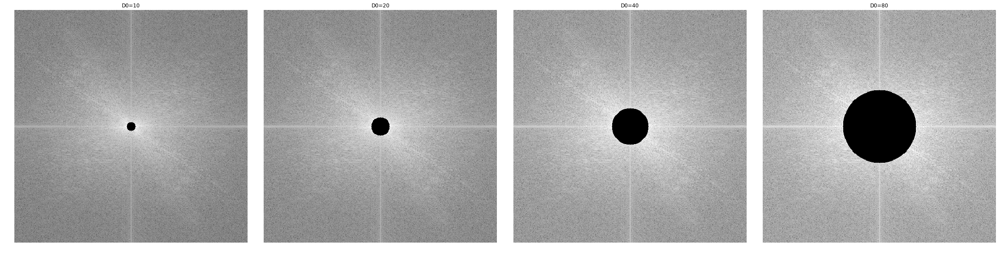

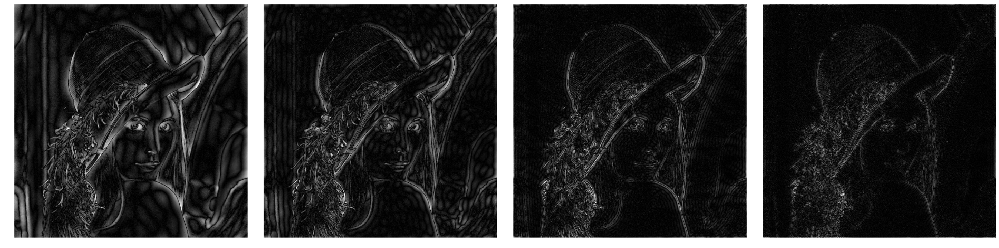

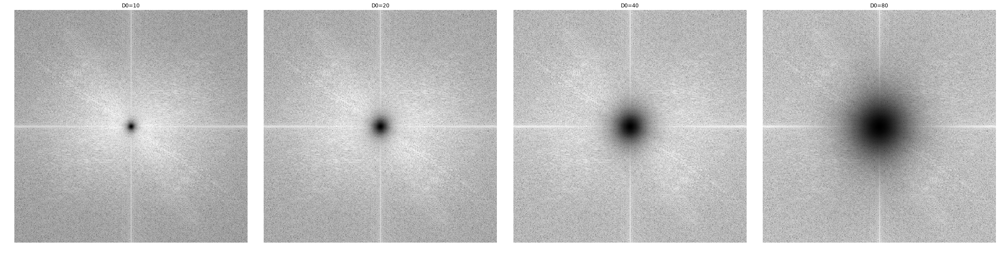

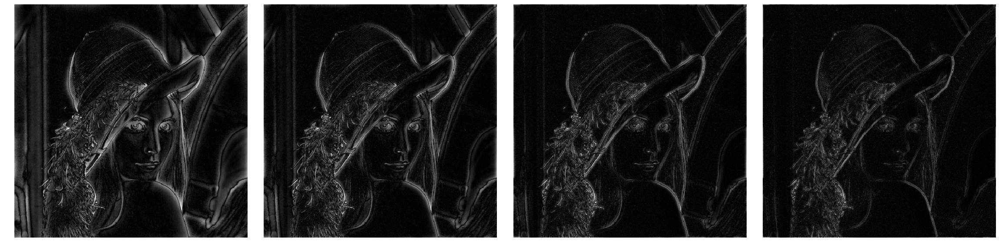

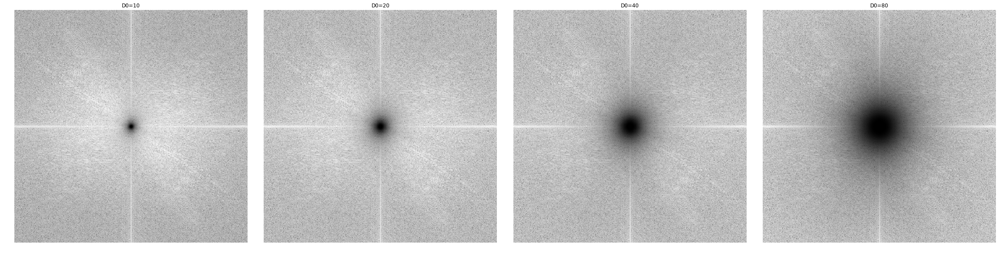

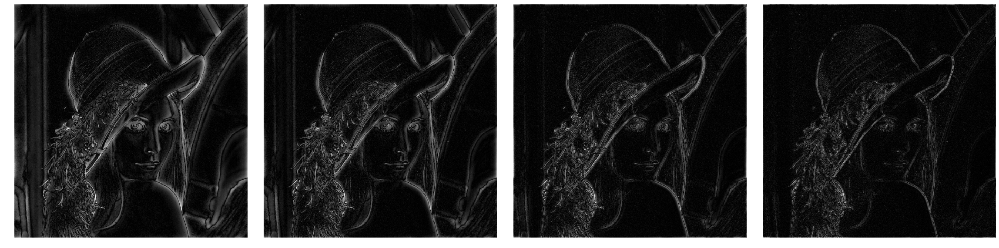

In [6]:
shape = img.shape
d0_list = [10, 20, 40, 80]

ideal_mask_list = [ideal_filter(shape, d0) for d0 in d0_list]
plot_filter_output(d0_list, ideal_mask_list)

butterworth_mask_list = [butterworth_filter(shape, d0, 1) for d0 in d0_list]
plot_filter_output(d0_list, butterworth_mask_list)

exponential_mask_list = [exponential_filter(shape, d0, 1) for d0 in d0_list]
plot_filter_output(d0_list, exponential_mask_list)

In [7]:
def roberts_operator(block):
    kernel1 = np.array([[1,0], [0,-1]])
    kernel2 = np.array([[0,-1], [1,0]])
    return np.abs(np.sum(block[1:,1:] * kernel1)) + np.abs(np.sum(block[1:,1:] * kernel2))

def sobel_operator(block, orientation):
    if orientation == 'horizontal':
        kernel = np.array([[-1,-2,-1], [0,0,0], [1,2,1]])
    elif orientation == 'vertical':
        kernel = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])
    else:
        raise('Orientation Error')
    return np.abs(np.sum(block * kernel))

def laplacian_operator(block):
    kernel = np.array([[0,-1,0], [-1,4,-1], [0,-1,0]])
    return np.abs(np.sum(block * kernel))

In [8]:
def operator_process(img, operator_type, orientation=None):
    n, m = img.shape
    res = np.zeros((n, m))
    for i in range(1, n-1):
        for j in range(1, m-1):
            if operator_type == 'roberts':
                res[i][j] = roberts_operator(img[i-1:i+2, j-1:j+2])
            elif operator_type == 'sobel':
                res[i][j] = sobel_operator(img[i-1:i+2, j-1:j+2], orientation)
            elif operator_type == 'laplacian':
                res[i][j] = laplacian_operator(img[i-1:i+2, j-1:j+2])
            else:
                raise('Operator Type Error')
    return res

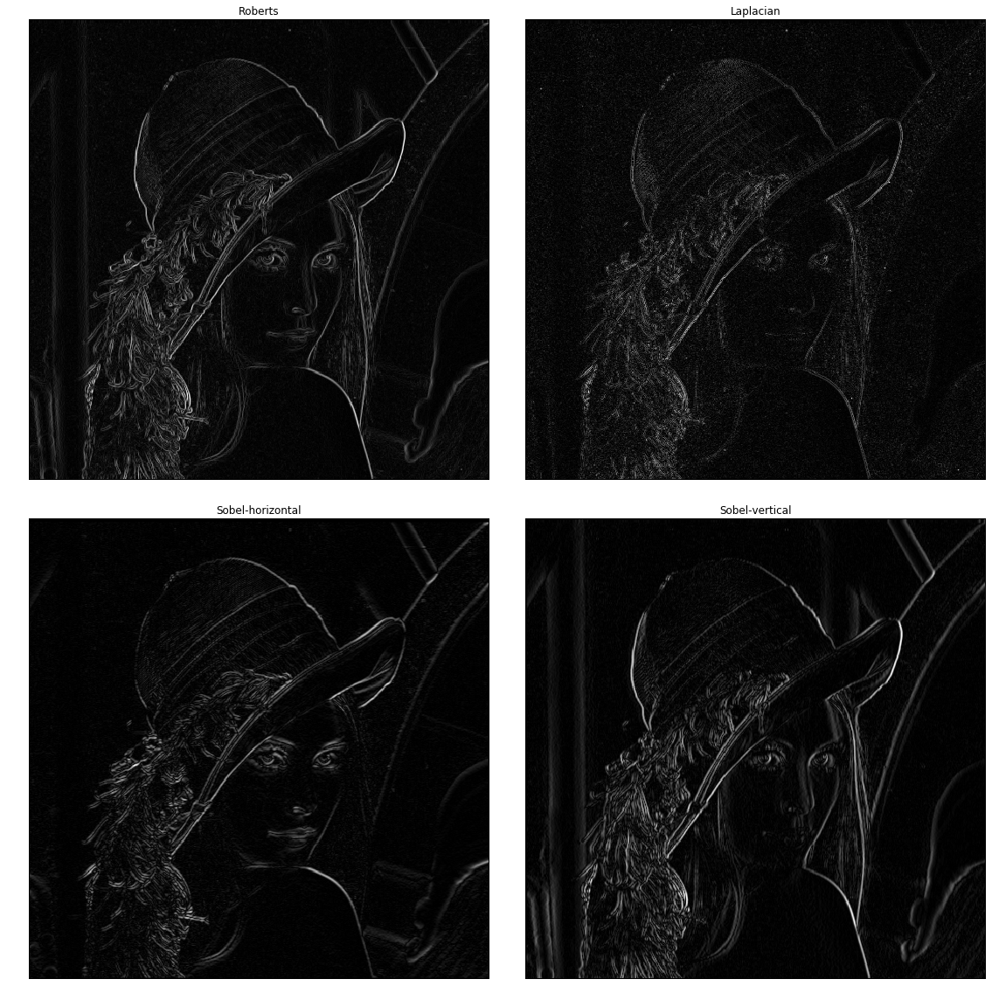

In [9]:
plt.figure(figsize=(16,16))
roberts_res = operator_process(img, 'roberts')
plt.subplot(221), plt.imshow(roberts_res, 'gray'), plt.axis('off'), plt.title('Roberts')

laplacian_res = operator_process(img, 'laplacian')
plt.subplot(222), plt.imshow(laplacian_res, 'gray'), plt.axis('off'), plt.title('Laplacian')

sobel_horizontal_res = operator_process(img, 'sobel', 'horizontal')
plt.subplot(223), plt.imshow(sobel_horizontal_res, 'gray'), plt.axis('off'), plt.title('Sobel-horizontal')

sobel_vertical_res = operator_process(img, 'sobel', 'vertical')
plt.subplot(224), plt.imshow(sobel_vertical_res, 'gray'), plt.axis('off'), plt.title('Sobel-vertical')
plt.tight_layout()

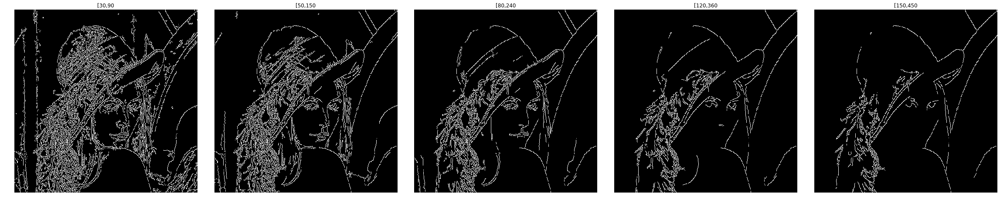

In [10]:
plt.figure(figsize=(32,32))
threshold1_list = [30, 50, 80, 120, 150]
for i in range(len(threshold1_list)):
    threshold1 = threshold1_list[i]
    threshold2 = 3 * threshold1
    canny_res = cv2.Canny(img, threshold1, threshold2)
    plt.subplot(1, 5, i+1), plt.imshow(canny_res, 'gray'), plt.axis('off'), plt.title('['+str(threshold1)+','+str(threshold2))
plt.tight_layout()

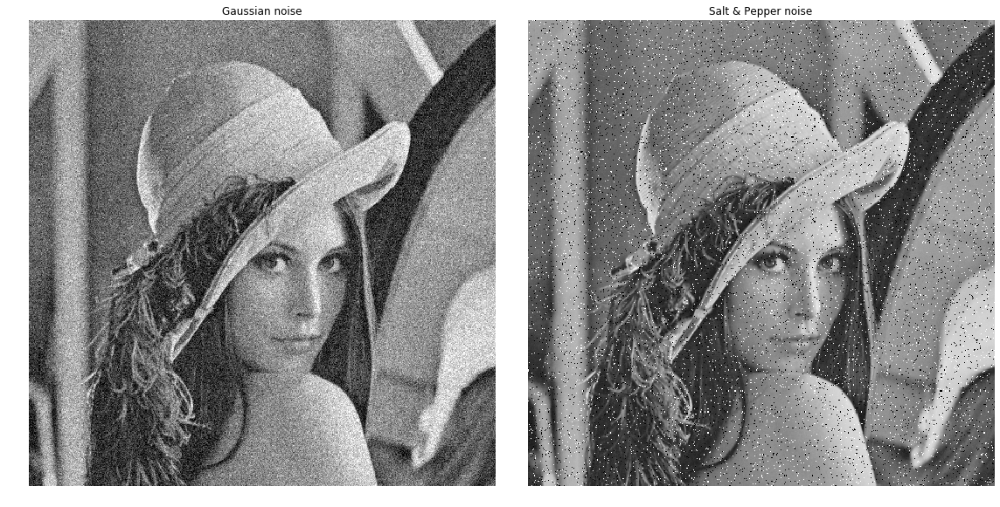

In [11]:
plt.figure(figsize=(16,16))
img_noise1 = skimage.util.random_noise(img, mode='gaussian')
img_noise2 = skimage.util.random_noise(img, mode='s&p')
plt.subplot(121), plt.imshow(img_noise1, 'gray'), plt.axis('off'), plt.title('Gaussian noise')
plt.subplot(122), plt.imshow(img_noise2, 'gray'), plt.axis('off'), plt.title('Salt & Pepper noise')
plt.tight_layout()

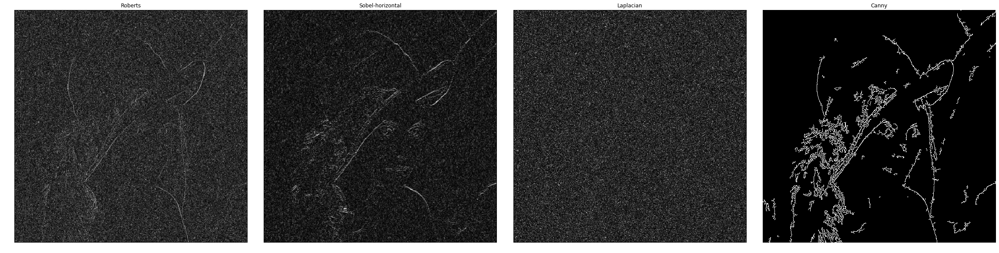

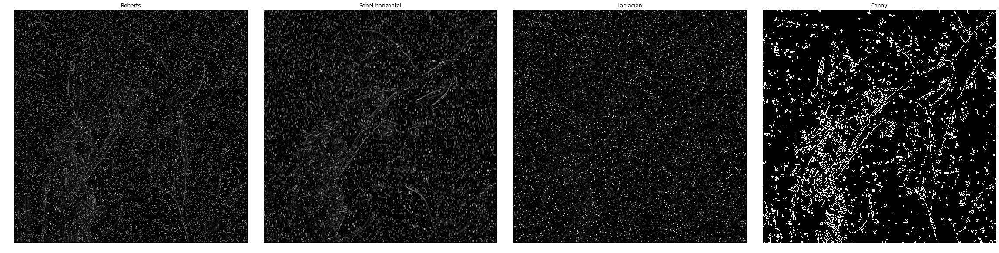

In [12]:
plt.figure(figsize=(32,32))
roberts_res1 = operator_process(img_noise1, 'roberts')
plt.subplot(141), plt.imshow(roberts_res1, 'gray'), plt.axis('off'), plt.title('Roberts')

sobel_horizontal_res1 = operator_process(img_noise1, 'sobel', 'horizontal')
plt.subplot(142), plt.imshow(sobel_horizontal_res1, 'gray'), plt.axis('off'), plt.title('Sobel-horizontal')

laplacian_res1 = operator_process(img_noise1, 'laplacian')
plt.subplot(143), plt.imshow(laplacian_res1, 'gray'), plt.axis('off'), plt.title('Laplacian')

canny_res1 = cv2.Canny(np.round(img_noise1 * 255).astype(np.uint8), 180, 180*3)
plt.subplot(144), plt.imshow(canny_res1, 'gray'), plt.axis('off'), plt.title('Canny')
plt.tight_layout()

plt.figure(figsize=(32,32))
roberts_res2 = operator_process(img_noise2, 'roberts')
plt.subplot(141), plt.imshow(roberts_res2, 'gray'), plt.axis('off'), plt.title('Roberts')

sobel_horizontal_res2 = operator_process(img_noise2, 'sobel', 'horizontal')
plt.subplot(142), plt.imshow(sobel_horizontal_res2, 'gray'), plt.axis('off'), plt.title('Sobel-horizontal')

laplacian_res2 = operator_process(img_noise2, 'laplacian')
plt.subplot(143), plt.imshow(laplacian_res2, 'gray'), plt.axis('off'), plt.title('Laplacian')

canny_res2 = cv2.Canny(np.round(img_noise2 * 255).astype(np.uint8), 180, 180*3)
plt.subplot(144), plt.imshow(canny_res2, 'gray'), plt.axis('off'), plt.title('Canny')
plt.tight_layout()

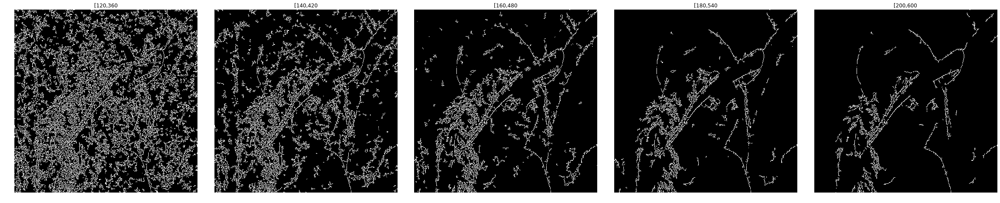

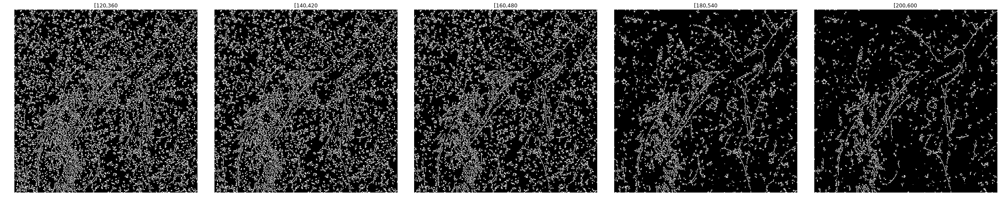

In [13]:
plt.figure(figsize=(32,32))
threshold1_list = [120, 140, 160, 180, 200]
for i in range(len(threshold1_list)):
    threshold1 = threshold1_list[i]
    threshold2 = 3 * threshold1
    canny_res1 = cv2.Canny(np.round(img_noise1 * 255).astype(np.uint8), threshold1, threshold2)
    plt.subplot(1, 5, i+1), plt.imshow(canny_res1, 'gray'), plt.axis('off'), plt.title('['+str(threshold1)+','+str(threshold2))
plt.tight_layout()
plt.figure(figsize=(32,32))
for i in range(len(threshold1_list)):
    threshold1 = threshold1_list[i]
    threshold2 = 3 * threshold1
    canny_res2 = cv2.Canny(np.round(img_noise2 * 255).astype(np.uint8), threshold1, threshold2)
    plt.subplot(1, 5, i+1), plt.imshow(canny_res2, 'gray'), plt.axis('off'), plt.title('['+str(threshold1)+','+str(threshold2))
plt.tight_layout()